# Day1

## Check the original database

In [1]:
sqlite3 -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db "SELECT count(DISTINCT username) FROM sample2bioinformatician;"

count(DISTINCT username)
------------------------
26                      


In [2]:
cd /shared/projects/2314_medbioinfo/hui/MedBioinfo23

In [180]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [4]:
mkdir analyses/blastn & cd analyses/blastn

[1] 53695
bash: cd: analyses/blastn: No such file or directory


: 1

In [2]:
cd analyses/blastn

In [3]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


## BLASTn of mini reads subsets versus refseq viral database

In [25]:
module load blast

In [6]:
makeblastdb --help

USAGE
  makeblastdb [-h] [-help] [-in input_file] [-input_type type]
    -dbtype molecule_type [-title database_title] [-parse_seqids]
    [-hash_index] [-mask_data mask_data_files] [-mask_id mask_algo_ids]
    [-mask_desc mask_algo_descriptions] [-gi_mask]
    [-gi_mask_name gi_based_mask_names] [-out database_name]
    [-blastdb_version version] [-max_file_sz number_of_bytes]
    [-logfile File_Name] [-taxid TaxID] [-taxid_map TaxIDMapFile] [-version]

DESCRIPTION
   Application to create BLAST databases, version 2.12.0+

Use '-help' to print detailed descriptions of command line arguments

Error: Unknown argument: "-help"
Error:  (CArgException::eInvalidArg) Unknown argument: "-help"


: 1

In [9]:
cd MedBioinfo23

In [14]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [ ]:
mkdir ../data/blast_db

In [24]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [21]:
cd MedBioinfo23

In [15]:
zcat /shared/projects/2314_medbioinfo/refseq/viral.genomic.fna.gz | makeblastdb -dbtype nucl -title Refseq_viral_genome -out data/blast_db/refseq_viral_genomic/



Building a new DB, current time: 05/29/2023 11:28:39
New DB name:   /shared/ifbstor1/projects/2314_medbioinfo/hui/MedBioinfo23/data/blast_db/refseq_viral_genomic
New DB title:  Refseq_viral_genome
Sequence type: Nucleotide
Keep MBits: T
Maximum file size: 1000000000B
Adding sequences from FASTA; added 14813 sequences in 7.82641 seconds.




In [22]:
blastdbcmd -info -db data/blast_db/refseq_viral_genomic

Database: Refseq_viral_genome
	14,813 sequences; 469,589,088 total bases

Date: May 29, 2023  11:28 AM	Longest sequence: 2,473,870 bases

BLASTDB Version: 5

Volumes:
	/shared/ifbstor1/projects/2314_medbioinfo/hui/MedBioinfo23/data/blast_db/refseq_viral_genomic


In [23]:
blastn -help

USAGE
  blastn [-h] [-help] [-import_search_strategy filename]
    [-export_search_strategy filename] [-task task_name] [-db database_name]
    [-dbsize num_letters] [-gilist filename] [-seqidlist filename]
    [-negative_gilist filename] [-negative_seqidlist filename]
    [-taxids taxids] [-negative_taxids taxids] [-taxidlist filename]
    [-negative_taxidlist filename] [-entrez_query entrez_query]
    [-db_soft_mask filtering_algorithm] [-db_hard_mask filtering_algorithm]
    [-subject subject_input_file] [-subject_loc range] [-query input_file]
    [-out output_file] [-evalue evalue] [-word_size int_value]
    [-gapopen open_penalty] [-gapextend extend_penalty]
    [-perc_identity float_value] [-qcov_hsp_perc float_value]
    [-max_hsps int_value] [-xdrop_ungap float_value] [-xdrop_gap float_value]
    [-xdrop_gap_final float_value] [-searchsp int_value]
    [-sum_stats bool_value] [-penalty penalty] [-reward reward] [-no_greedy]
    [-min_raw_gapped_score int_value] [-template_type

In [53]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [24]:
module load seqkit

In [52]:
seqkit stats data/merged_pairs/*.fastq.gz

file                                                       format  type  num_seqs     sum_len  min_len  avg_len  max_len
data/merged_pairs/ERR6913156.flash.extendedFrags.fastq.gz  FASTQ   DNA     22,291   3,262,339       35    146.4      292
data/merged_pairs/ERR6913156.flash.notCombined_1.fastq.gz  FASTQ   DNA      1,867     280,159       35    150.1      151
data/merged_pairs/ERR6913156.flash.notCombined_2.fastq.gz  FASTQ   DNA      1,867     280,159       35    150.1      151
data/merged_pairs/ERR6913158.flash.extendedFrags.fastq.gz  FASTQ   DNA    690,579  99,890,771       35    144.6      292
data/merged_pairs/ERR6913158.flash.notCombined_1.fastq.gz  FASTQ   DNA     65,028   9,760,304       35    150.1      151
data/merged_pairs/ERR6913158.flash.notCombined_2.fastq.gz  FASTQ   DNA     65,028   9,759,131       35    150.1      151
data/merged_pairs/ERR6913168.flash.extendedFrags.fastq.gz  FASTQ   DNA     63,620   9,531,276       35    149.8      292
data/merged_pairs/ERR6913168.fla

In [54]:
seqkit fq2fa data/merged_pairs/ERR6913158.flash.extendedFrags.fastq.gz > data/merged_pairs/ERR6913156.flash.extendedFrags.fna

In [55]:
seqkit range --range 1:101 data/merged_pairs/ERR6913156.flash.extendedFrags.fna > data/merged_pairs/ERR6913156.flash.extendedFrags.100.fna
seqkit range --range 101:1101 data/merged_pairs/ERR6913156.flash.extendedFrags.fna > data/merged_pairs/ERR6913156.flash.extendedFrags.1000.fna
seqkit range --range 1101:11101 data/merged_pairs/ERR6913156.flash.extendedFrags.fna > data/merged_pairs/ERR6913156.flash.extendedFrags.10000.fna

In [41]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [47]:
cat ./analyses/huiyu_run_accession.txt

ERR6913156
ERR6913158
ERR6913169
ERR6913264
ERR6913265
ERR6913168
ERR6913252
ERR6913254


In [26]:
seqkit stats data/merged_pairs/ERR6913156.*.fna

file                                                        format  type  num_seqs     sum_len  min_len  avg_len  max_len
data/merged_pairs/ERR6913156.flash.extendedFrags.10000.fna  FASTA   DNA     10,001   1,446,399       36    144.6      292
data/merged_pairs/ERR6913156.flash.extendedFrags.1000.fna   FASTA   DNA      1,001     146,176       40      146      291
data/merged_pairs/ERR6913156.flash.extendedFrags.100.fna    FASTA   DNA        101      14,125       62    139.9      285
data/merged_pairs/ERR6913156.flash.extendedFrags.fna        FASTA   DNA    690,579  99,890,771       35    144.6      292


In [30]:
cp scripts/generic_sbatch_array.sh scripts/fastq_subsamples_blastn_vs_viral_refseq_sbatch.sh

make dir for output before the sbatch

In [59]:
mkdir analyses/blastn/output

In [60]:
squeue -u huiyu

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
          33578763      fast  jupyter    huiyu  R    1:26:03      1 cpu-node-3


In [4]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


## sbatch job arrays

In [14]:
sbatch scripts/fastq_subsamples_blastn_vs_viral_refseq_sbatch.sh

Submitted batch job 33580193


In [21]:
sacct -j 33580193

       JobID    JobName  Partition    Account  AllocCPUS      State ExitCode 
------------ ---------- ---------- ---------- ---------- ---------- -------- 
33580193     MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33580193.ba+      batch            2314_medb+          1  COMPLETED      0:0 
33580193.0    bastn_100            2314_medb+          1  COMPLETED      0:0 
33580193.1   bastn_1000            2314_medb+          1  COMPLETED      0:0 
33580193.2   bastn_100+            2314_medb+          1  COMPLETED      0:0 


In [27]:
sbatch scripts/fastq_subsamples_blastn_vs_viral_refseq_sbatch.sh

Submitted batch job 33580520


In [35]:
sacct -j 33580520

       JobID    JobName  Partition    Account  AllocCPUS      State ExitCode 
------------ ---------- ---------- ---------- ---------- ---------- -------- 
33580520     MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33580520.ba+      batch            2314_medb+          1  COMPLETED      0:0 
33580520.0    bastn_100            2314_medb+          1  COMPLETED      0:0 
33580520.1   bastn_1000            2314_medb+          1  COMPLETED      0:0 
33580520.2   bastn_100+            2314_medb+          1  COMPLETED      0:0 


In [22]:
cat analyses/blastn/fastq_subsample_blastn_vs_refseq_viral_100.tsv

In [37]:
grep -B 4 -A20 "significant alignments" analyses/blastn/fastq_subsample_blastn_vs_refseq_viral_10000.blast

Query= ERR6913158.917.1 917 length=94

Length=94
                                                                      Score     E
Sequences producing significant alignments:                          (Bits)  Value

NC_054146.1 Ralstonia phage phiRSP, complete genome                   63.9    2e-09


>NC_054146.1 Ralstonia phage phiRSP, complete genome
Length=44526

 Score = 63.9 bits (34),  Expect = 2e-09
 Identities = 34/34 (100%), Gaps = 0/34 (0%)
 Strand=Plus/Minus

Query  32     CCACCAGCGCCCGCGAAAAGAGCCAGCTCATTCA  65
              ||||||||||||||||||||||||||||||||||
Sbjct  13689  CCACCAGCGCCCGCGAAAAGAGCCAGCTCATTCA  13656



Lambda      K        H
    1.33    0.621     1.12 

--
Query= ERR6913158.1572.1 1572 length=119

Length=119
                                                                      Score     E
Sequences producing significant alignments:                          (Bits)  Value

NC_031904.1 Flavobacterium phage Fpv3, complete genome                215     7e-55
NC_0319

In [38]:
cp scripts/fastq_subsamples_blastn_vs_viral_refseq_sbatch.sh scripts/fastq_full_blastn_vs_viral_refseq_sbatch.sh

In [39]:
ls data/merged_pairs/

ERR6913156.flash.extendedFrags.10000.fna
ERR6913156.flash.extendedFrags.1000.fna
ERR6913156.flash.extendedFrags.100.fna
ERR6913156.flash.extendedFrags.fastq.gz
ERR6913156.flash.extendedFrags.fna
ERR6913156.flash.hist
ERR6913156.flash.histogram
ERR6913156.flash.notCombined_1.fastq.gz
ERR6913156.flash.notCombined_2.fastq.gz
ERR6913158.flash.extendedFrags.fastq.gz
ERR6913158.flash.hist
ERR6913158.flash.histogram
ERR6913158.flash.notCombined_1.fastq.gz
ERR6913158.flash.notCombined_2.fastq.gz
ERR6913168.flash.extendedFrags.fastq.gz
ERR6913168.flash.hist
ERR6913168.flash.histogram
ERR6913168.flash.notCombined_1.fastq.gz
ERR6913168.flash.notCombined_2.fastq.gz
ERR6913169.flash.extendedFrags.fastq.gz
ERR6913169.flash.hist
ERR6913169.flash.histogram
ERR6913169.flash.notCombined_1.fastq.gz
ERR6913169.flash.notCombined_2.fastq.gz
ERR6913252.flash.extendedFrags.fastq.gz
ERR6913252.flash.hist
ERR6913252.flash.histogram
ERR6913252.flash.notCombined_1.fastq.gz
ERR6913252.flash.notCombined_2.fastq.gz


In [103]:
seqkit stats data/merged_pairs/*.fasta

file                                                    format  type  num_seqs     sum_len  min_len  avg_len  max_len
data/merged_pairs/ERR6913156.flash.extendedFrags.fasta  FASTA   DNA     22,291   3,262,339       35    146.4      292
data/merged_pairs/ERR6913158.flash.extendedFrags.fasta  FASTA   DNA    690,579  99,890,771       35    144.6      292
data/merged_pairs/ERR6913168.flash.extendedFrags.fasta  FASTA   DNA     63,620   9,531,276       35    149.8      292
data/merged_pairs/ERR6913169.flash.extendedFrags.fasta  FASTA   DNA     76,719  11,359,696       35    148.1      292
data/merged_pairs/ERR6913252.flash.extendedFrags.fasta  FASTA   DNA      8,980   1,182,504       35    131.7      292
data/merged_pairs/ERR6913254.flash.extendedFrags.fasta  FASTA   DNA     47,673   5,033,825       35    105.6      292
data/merged_pairs/ERR6913264.flash.extendedFrags.fasta  FASTA   DNA      9,930   1,186,470       35    119.5      292
data/merged_pairs/ERR6913265.flash.extendedFrags.fasta  

## BLASTn of full FASTQ versus refseq viral database

In [109]:
sbatch scripts/fastq_full_blastn_vs_viral_refseq_sbatch.sh

Submitted batch job 33582512


In [144]:
sacct -j 33582512

       JobID    JobName  Partition    Account  AllocCPUS      State ExitCode 
------------ ---------- ---------- ---------- ---------- ---------- -------- 
33582512_1   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33582512_1.+      batch            2314_medb+          1  COMPLETED      0:0 
33582512_1.0 ERR6913156            2314_medb+          1  COMPLETED      0:0 
33582512_2   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33582512_2.+      batch            2314_medb+          1  COMPLETED      0:0 
33582512_2.0 ERR6913158            2314_medb+          1  COMPLETED      0:0 
33582512_3   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33582512_3.+      batch            2314_medb+          1  COMPLETED      0:0 
33582512_3.0 ERR6913169            2314_medb+          1  COMPLETED      0:0 
33582512_4   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33582512_4.+      batch            2314_medb+          1  COMPLE

In [147]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS -j 33582512

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS 
-------------------- -------- ---------- ---------- -------- ---------- ---------- 
          MedBioinfo        1        2Gn  COMPLETED      0:0   00:00:11            
               batch        1        2Gn  COMPLETED      0:0   00:00:11      1344K 
          ERR6913156        1        2Gn  COMPLETED      0:0   00:00:09       960K 
          MedBioinfo        1        2Gn  COMPLETED      0:0   00:02:26            
               batch        1        2Gn  COMPLETED      0:0   00:02:26      7964K 
          ERR6913158        1        2Gn  COMPLETED      0:0   00:02:26    478000K 
          MedBioinfo        1        2Gn  COMPLETED      0:0   00:00:21            
               batch        1        2Gn  COMPLETED      0:0   00:00:21      1336K 
          ERR6913169        1        2Gn  COMPLETED      0:0   00:00:19       956K 
          MedBioinfo        1        2Gn  COMPLETED      0:0   00:00:05     

In [155]:
wc -l analyses/blastn/*.out

   548 analyses/blastn/ERR6913156_blastn_vs_viral.out
  2808 analyses/blastn/ERR6913158_blastn_vs_viral.out
   344 analyses/blastn/ERR6913168_blastn_vs_viral.out
   383 analyses/blastn/ERR6913169_blastn_vs_viral.out
   197 analyses/blastn/ERR6913252_blastn_vs_viral.out
   488 analyses/blastn/ERR6913254_blastn_vs_viral.out
    45 analyses/blastn/ERR6913264_blastn_vs_viral.out
   133 analyses/blastn/ERR6913265_blastn_vs_viral.out
  4946 total


using a one-liner with cut sort uniq sort piped in this order, can you give the list of the viral genomes hit by your BLASTn with the number of hits (sorted by increasing number of hits) ?
 - the two most important hints here are:
 - - to use the -c switch of uniq (this the main secret for to make a solution possible)
 - - to use the -n switch in the second instance of sort (often a forgotten issue in sorting...)
The result should look something like this (first column is the number of reads that hit, the second is the accession number of the viral genome):

In [164]:
cut --help

Usage: cut OPTION... [FILE]...
Print selected parts of lines from each FILE to standard output.

Mandatory arguments to long options are mandatory for short options too.
  -b, --bytes=LIST        select only these bytes
  -c, --characters=LIST   select only these characters
  -d, --delimiter=DELIM   use DELIM instead of TAB for field delimiter
  -f, --fields=LIST       select only these fields;  also print any line
                            that contains no delimiter character, unless
                            the -s option is specified
  -n                      with -b: don't split multibyte characters
      --complement        complement the set of selected bytes, characters
                            or fields
  -s, --only-delimited    do not print lines not containing delimiters
      --output-delimiter=STRING  use STRING as the output delimiter
                            the default is to use the input delimiter
      --help     display this help and exit
      --version  ou

In [179]:
cat analyses/blastn/*.out| cut -f2 | sort | uniq -c | sort -n -r | head -n5

    149 NC_048831.1
    122 NC_019401.1
    115 NC_041917.1
    104 NC_025447.1
     98 NC_048833.1
sort: write failed: standard output: Broken pipe
sort: write error


In [182]:
for file in analyses/blastn/*.out 
do
   echo "$file"
   cut -f2 $file | sort | uniq -c | sort -n -r | head -n5
done

analyses/blastn/ERR6913156_blastn_vs_viral.out
     26 NC_001416.1
     22 NC_019723.1
     19 NC_049955.1
     19 NC_049952.1
     19 NC_049951.1
analyses/blastn/ERR6913158_blastn_vs_viral.out
    112 NC_048831.1
     97 NC_019401.1
     95 NC_041917.1
     91 NC_025447.1
     77 NC_027364.1
analyses/blastn/ERR6913168_blastn_vs_viral.out
     33 NC_027981.1
     33 NC_004456.1
     31 NC_019722.1
     13 NC_019401.1
     11 NC_048831.1
analyses/blastn/ERR6913169_blastn_vs_viral.out
     57 NC_027981.1
     54 NC_019722.1
     52 NC_004456.1
     16 NC_048831.1
     11 NC_048842.1
analyses/blastn/ERR6913252_blastn_vs_viral.out
     76 NC_006577.2
     10 NC_003045.1
      5 NC_006213.1
      4 NC_012936.1
      3 NC_046954.1
analyses/blastn/ERR6913254_blastn_vs_viral.out
     35 NC_001405.1
     35 AC_000008.1
     35 AC_000007.1
     32 AC_000017.1
     12 NC_008168.1
analyses/blastn/ERR6913264_blastn_vs_viral.out
      4 NC_001405.1
      4 AC_000017.1
      4 AC_000008.1
      4 AC_

## BIG question: is a BLASTn of all study reads versus nt reference DB achievable ?

In [3]:
cd /shared/projects/2314_medbioinfo/hui/MedBioinfo23
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [3]:
cp scripts/fastq_full_blastn_vs_viral_refseq_sbatch.sh scripts/fastq_blastn_vs_nt_refseq_sbatch.sh

In [4]:
mkdir analyses/fastq_subsample_blastn_vs_NT

In [2]:
module load seqkit

In [7]:
seqkit range --range 200:210 data/merged_pairs/ERR6913158.flash.extendedFrags.fasta > data/merged_pairs/ERR6913158.flash.extendedFrags.10.fasta

In [2]:
sbatch scripts/fastq_blastn_vs_nt_refseq_sbatch.sh

Submitted batch job 33590753


In [6]:
sacct -j 33590753

       JobID    JobName  Partition    Account  AllocCPUS      State ExitCode 
------------ ---------- ---------- ---------- ---------- ---------- -------- 
33590753     MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33590753.ba+      batch            2314_medb+          1  COMPLETED      0:0 
33590753.0   ERR691315+            2314_medb+          1  COMPLETED      0:0 


In [7]:
sacct --user huiyu

       JobID    JobName  Partition    Account  AllocCPUS      State ExitCode 
------------ ---------- ---------- ---------- ---------- ---------- -------- 
33586683        jupyter       fast 2314_medb+          1 CANCELLED+      0:0 
33586683.ba+      batch            2314_medb+          1  CANCELLED     0:15 
33586683.0   batchspaw+            2314_medb+          1  COMPLETED      0:0 
33590656_1   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33590656_1.+      batch            2314_medb+          1  COMPLETED      0:0 
33590656_1.0 ERR691315+            2314_medb+          1  COMPLETED      0:0 
33590656_2   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33590656_2.+      batch            2314_medb+          1  COMPLETED      0:0 
33590656_2.0 ERR691315+            2314_medb+          1  COMPLETED      0:0 
33590656_3   MedBioinfo       fast 2314_medb+          1  COMPLETED      0:0 
33590656_3.+      batch            2314_medb+          1  COMPLE

In [14]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS -j 33590753

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS 
-------------------- -------- ---------- ---------- -------- ---------- ---------- 
          MedBioinfo        1       70Gn  COMPLETED      0:0   00:11:36            
               batch        1       70Gn  COMPLETED      0:0   00:11:36      7884K 
ERR6913158_bastn_10+        1       70Gn  COMPLETED      0:0   00:11:35  19648676K 


## Benchmarking to estimate cpu.hours

In [3]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [5]:
#select the 
sacct -P --format=JobID%15,JobName%18,ReqCPUS,ReqMem,Timelimit,State,ExitCode,Start,elapsedRAW,CPUTimeRAW,MaxRSS,NodeList -S 2023-05-29 -j 33582512\
    | grep ERR > blastn_full_FASTQ_vs_viral_sbatch_array.sacct
cat blastn_full_FASTQ_vs_viral_sbatch_array.sacct

33582512_1.0|ERR6913156|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:17|9|9|960K|cpu-node-88
33582512_2.0|ERR6913158|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:15|146|146|478000K|cpu-node-88
33582512_3.0|ERR6913169|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:17|19|19|956K|cpu-node-88
33582512_4.0|ERR6913264|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:15|5|5|964K|cpu-node-88
33582512_5.0|ERR6913265|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:17|6|6|960K|cpu-node-88
33582512_6.0|ERR6913168|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:16|17|17|964K|cpu-node-88
33582512_7.0|ERR6913252|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:16|3|3|956K|cpu-node-88
33582512_8.0|ERR6913254|1|2Gn||COMPLETED|0:0|2023-05-29T14:56:17|9|9|972K|cpu-node-88


In [6]:
sqlite3 -batch -separator "|" /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
    ".import ./blastn_full_FASTQ_vs_viral_sbatch_array.sacct blastn_viral_resources_used"

In [7]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db "select * from blastn_viral_resources_used where JobID like '33582512%';"

┌──────────────┬────────────┬─────────┬────────┬───────────┬───────────┬──────────┬─────────────────────┬────────────┬────────────┬─────────┬─────────────┐
│    JobID     │  JobName   │ ReqCPUS │ ReqMem │ Timelimit │   State   │ ExitCode │        Start        │ ElapsedRAW │ CPUTimeRAW │ MaxRSS  │  NodeList   │
├──────────────┼────────────┼─────────┼────────┼───────────┼───────────┼──────────┼─────────────────────┼────────────┼────────────┼─────────┼─────────────┤
│ 33582512_1.0 │ ERR6913156 │ 1       │ 2Gn    │           │ COMPLETED │ 0:0      │ 2023-05-29T14:56:17 │ 9          │ 9          │ 960K    │ cpu-node-88 │
│ 33582512_2.0 │ ERR6913158 │ 1       │ 2Gn    │           │ COMPLETED │ 0:0      │ 2023-05-29T14:56:15 │ 146        │ 146        │ 478000K │ cpu-node-88 │
│ 33582512_3.0 │ ERR6913169 │ 1       │ 2Gn    │           │ COMPLETED │ 0:0      │ 2023-05-29T14:56:17 │ 19         │ 19         │ 956K    │ cpu-node-88 │
│ 33582512_4.0 │ ERR6913264 │ 1       │ 2Gn    │           │ COM

In [1]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db "select * from blastn_viral_resources_used;"

┌───────────────┬──────────────┬─────────┬────────┬───────────┬───────────┬──────────┬─────────────────────┬────────────┬────────────┬─────────┬─────────────┐
│     JobID     │   JobName    │ ReqCPUS │ ReqMem │ Timelimit │   State   │ ExitCode │        Start        │ ElapsedRAW │ CPUTimeRAW │ MaxRSS  │  NodeList   │
├───────────────┼──────────────┼─────────┼────────┼───────────┼───────────┼──────────┼─────────────────────┼────────────┼────────────┼─────────┼─────────────┤
│ 33575030_1.1  │ ERR6913174   │ 24      │ 2Gn    │           │ COMPLETED │ 0:0      │ 2023-05-28T12:03:56 │ 20         │ 480        │ 1252K   │ cpu-node-15 │
│ 33575030_2.1  │ ERR6913270   │ 24      │ 2Gn    │           │ COMPLETED │ 0:0      │ 2023-05-28T12:04:09 │ 19         │ 456        │ 1232K   │ cpu-node-27 │
│ 33575030_3.1  │ ERR6913175   │ 24      │ 2Gn    │           │ COMPLETED │ 0:0      │ 2023-05-28T12:04:17 │ 30         │ 720        │ 236340K │ cpu-node-29 │
│ 33575030_4.1  │ ERR6913271   │ 24      │ 2Gn

In [10]:
library(DBI)
mydb <- dbConnect(RSQLite::SQLite(), "/shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db")
res_used <-dbGetQuery(mydb, 'select JobName,CPUTimeRAW,MaxRSS,read_count,base_count,patient_code,host_disease_status,nuc from blastn_viral_resources_used \
cpu inner join sample_annot spl on cpu.JobName=spl.run_accession;')
head(res_used)

,JobName,CPUTimeRAW,MaxRSS,read_count,base_count,patient_code,host_disease_status,nuc
,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
1,ERR6913101,87,490192K,658268,80692720,P4,SARS-CoV-2 positive,DNA
2,ERR6913102,0,968K,102524,13193813,P11,SARS-CoV-2 positive,DNA
3,ERR6913103,80,175240K,385740,49060845,P19,SARS-CoV-2 positive,DNA
4,ERR6913104,396,432180K,610606,76430173,P22,SARS-CoV-2 positive,DNA
5,ERR6913106,1632,515412K,1271618,168661241,P55,SARS-CoV-2 positive,DNA
6,ERR6913107,21,1044K,190648,24785538,P66,SARS-CoV-2 positive,DNA


In [11]:
res_used$minutes <- as.integer(res_used$CPUTimeRAW) / 60
res_used$read_M  <- res_used$read_count / 1000000
res_used$ram_M   <- as.numeric(sub('K$','', res_used$MaxRSS, perl = TRUE)) / 1000
res_used$pat     <- as.factor(res_used$patient_code)
head(res_used)

,JobName,CPUTimeRAW,MaxRSS,read_count,base_count,patient_code,host_disease_status,nuc,minutes,read_M,ram_M,pat
,<chr>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<fct>
1,ERR6913101,87,490192K,658268,80692720,P4,SARS-CoV-2 positive,DNA,1.450000,0.658268,490.192,P4
2,ERR6913102,0,968K,102524,13193813,P11,SARS-CoV-2 positive,DNA,0.000000,0.102524,0.968,P11
3,ERR6913103,80,175240K,385740,49060845,P19,SARS-CoV-2 positive,DNA,1.333333,0.385740,175.240,P19
4,ERR6913104,396,432180K,610606,76430173,P22,SARS-CoV-2 positive,DNA,6.600000,0.610606,432.180,P22
5,ERR6913106,1632,515412K,1271618,168661241,P55,SARS-CoV-2 positive,DNA,27.200000,1.271618,515.412,P55
6,ERR6913107,21,1044K,190648,24785538,P66,SARS-CoV-2 positive,DNA,0.350000,0.190648,1.044,P66


In [7]:
library(ggplot2)

`geom_smooth()` using formula 'y ~ x'



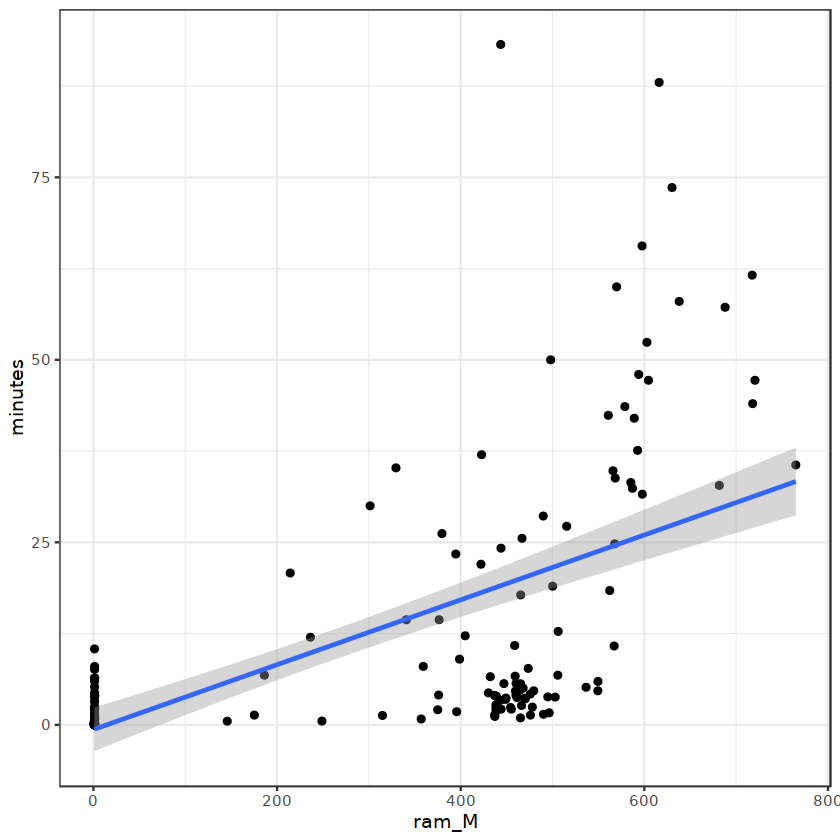

In [14]:
ggplot(res_used, aes(x=ram_M, y=minutes)) + 
  geom_point()+
  geom_smooth(method=lm)+
  theme_bw()

# DAY2

In [1]:
cd /shared/projects/2314_medbioinfo/hui/MedBioinfo23
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [5]:
mkdir analyses/kraken2

In [9]:
module load kraken2

In [18]:
kraken2 --help

Usage: kraken2 [options] <filename(s)>

Options:
  --db NAME               Name for Kraken 2 DB
                          (default: none)
  --threads NUM           Number of threads (default: 1)
  --quick                 Quick operation (use first hit or hits)
  --unclassified-out FILENAME
                          Print unclassified sequences to filename
  --classified-out FILENAME
                          Print classified sequences to filename
  --output FILENAME       Print output to filename (default: stdout); "-" will
                          suppress normal output
  --confidence FLOAT      Confidence score threshold (default: 0.0); must be
                          in [0, 1].
  --minimum-base-quality NUM
                          Minimum base quality used in classification (def: 0,
                          only effective with FASTQ input).
  --report FILENAME       Print a report with aggregrate counts/clade to file
  --use-mpa-style         With --report, format report output

In [3]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [15]:
cp scripts/fastq_blastn_vs_nt_refseq_sbatch.sh scripts/kraken_sbatch.sh

In [16]:
ls /shared/projects/2314_medbioinfo/kraken2/arch_bact_vir_hum_protoz_fung/

database100mers.kmer_distrib  database50mers.kmer_distrib  opts.k2d
database150mers.kmer_distrib  database75mers.kmer_distrib  seqid2taxid.map
database200mers.kmer_distrib  hash.k2d			   taxo.k2d
database250mers.kmer_distrib  inspect.txt
database300mers.kmer_distrib  ktaxonomy.tsv


In [37]:
sbatch scripts/kraken_sbatch.sh

Submitted batch job 33591789


In [3]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS,NodeList -j 33591789

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS        NodeList 
-------------------- -------- ---------- ---------- -------- ---------- ---------- --------------- 
          MedBioinfo       16       90Gn  COMPLETED      0:0   00:02:31                cpu-node-73 
               batch       16       90Gn  COMPLETED      0:0   00:02:31      7940K     cpu-node-73 
    kraken2_vs_abvhp       16       90Gn  COMPLETED      0:0   00:02:28  71848464K     cpu-node-73 


In [4]:
head analyses/kraken2/kraken_vs_abvhp.kraken

U	ERR6913158.1.1	0	149|150	0:115 |:| 0:116
U	ERR6913158.2.1	0	93|93	0:59 |:| 0:59
U	ERR6913158.3.1	0	151|149	0:117 |:| 0:115
U	ERR6913158.4.1	0	88|88	0:54 |:| 0:54
U	ERR6913158.5.1	0	151|149	0:117 |:| 0:115
U	ERR6913158.6.1	0	69|69	0:35 |:| 0:35
U	ERR6913158.7.1	0	151|149	0:117 |:| 0:115
U	ERR6913158.8.1	0	148|151	0:114 |:| 0:117
C	ERR6913158.9.1	1224	150|150	0:10 1224:5 0:101 |:| 0:103 1224:5 0:8
C	ERR6913158.10.1	2772066	129|129	0:17 2772066:2 0:76 |:| 0:76 2772066:2 0:17


In [5]:
head analyses/kraken2/kraken_vs_abvhp.kraken.report

 92.52	699069	699069	U	0	unclassified
  7.48	56538	98	R	1	root
  7.33	55360	121	R1	131567	  cellular organisms
  6.99	52796	1043	D	2	    Bacteria
  4.02	30374	652	P	1224	      Pseudomonadota
  2.05	15471	299	C	1236	        Gammaproteobacteria
  0.54	4109	1	O	72274	          Pseudomonadales
  0.54	4053	42	F	135621	            Pseudomonadaceae
  0.48	3602	966	G	286	              Pseudomonas
  0.14	1048	134	G1	196821	                unclassified Pseudomonas


In [7]:
ls -lh /shared/projects/2314_medbioinfo/hui/MedBioinfo23/data/sra_fastq

total 120M
-rw-rw----+ 1 huiyu huiyu 1.5M May 24 23:00 ERR6913156_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 1.5M May 24 23:00 ERR6913156_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu  45M May 24 23:03 ERR6913158_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu  46M May 24 23:03 ERR6913158_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 4.3M May 24 23:03 ERR6913168_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 4.4M May 24 23:03 ERR6913168_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 5.0M May 24 23:03 ERR6913169_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 5.0M May 24 23:03 ERR6913169_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 578K May 24 23:03 ERR6913252_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 585K May 24 23:03 ERR6913252_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 2.4M May 24 23:04 ERR6913254_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 2.4M May 24 23:04 ERR6913254_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 485K May 24 23:03 ERR6913264_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 491K May 24 23:03 ERR6913264_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 798K May 24 23:03 ERR6913265_1.fastq.gz

In [8]:
sbatch scripts/kraken_sbatch.sh

Submitted batch job 33592127


In [30]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS,NodeList -j 33592127

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS        NodeList 
-------------------- -------- ---------- ---------- -------- ---------- ---------- --------------- 
          MedBioinfo       16       90Gn  COMPLETED      0:0   00:01:45                cpu-node-57 
               batch       16       90Gn  COMPLETED      0:0   00:01:45      7928K     cpu-node-57 
    kraken2_vs_abvhp       16       90Gn  COMPLETED      0:0   00:01:43  66994456K     cpu-node-57 


In [31]:
sbatch scripts/kraken_sbatch.sh

Submitted batch job 33592461


In [4]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS,NodeList -j 33592461

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS        NodeList 
-------------------- -------- ---------- ---------- -------- ---------- ---------- --------------- 
          MedBioinfo       16       90Gn  COMPLETED      0:0   00:02:56                cpu-node-73 
               batch       16       90Gn  COMPLETED      0:0   00:02:56      7932K     cpu-node-73 
    kraken2_vs_abvhp       16       90Gn  COMPLETED      0:0   00:02:55     65988M     cpu-node-73 


# DAY3

## kraken2 + bracken sbatch on a single sample

In [1]:
cd /shared/projects/2314_medbioinfo/hui/MedBioinfo23
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [4]:
module load bracken

In [5]:
module load seqkit

In [8]:
bracken -help

/shared/ifbstor1/software/miniconda/envs/bracken-2.6.1/bin/bracken: illegal option -- h
Usage: bracken -d MY_DB -i INPUT -o OUTPUT -w OUTREPORT -r READ_LEN -l LEVEL -t THRESHOLD
  MY_DB          location of Kraken database
  INPUT          Kraken REPORT file to use for abundance estimation
  OUTPUT         file name for Bracken default output
  OUTREPORT      New Kraken REPORT output file with Bracken read estimates
  READ_LEN       read length to get all classifications for (default: 100)
  LEVEL          level to estimate abundance at [options: D,P,C,O,F,G,S,S1,etc] (default: S)
  THRESHOLD      number of reads required PRIOR to abundance estimation to perform reestimation (default: 0)



In [10]:
seqkit stats data/sra_fastq/ERR6913158_1.fastq.gz

file                                  format  type  num_seqs     sum_len  min_len  avg_len  max_len
data/sra_fastq/ERR6913158_1.fastq.gz  FASTQ   DNA    755,607  96,068,088       35    127.1      151


In [11]:
ls -lh data/sra_fastq

total 120M
-rw-rw----+ 1 huiyu huiyu 1.5M May 24 23:00 ERR6913156_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 1.5M May 24 23:00 ERR6913156_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu  45M May 24 23:03 ERR6913158_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu  46M May 24 23:03 ERR6913158_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 4.3M May 24 23:03 ERR6913168_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 4.4M May 24 23:03 ERR6913168_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 5.0M May 24 23:03 ERR6913169_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 5.0M May 24 23:03 ERR6913169_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 578K May 24 23:03 ERR6913252_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 585K May 24 23:03 ERR6913252_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 2.4M May 24 23:04 ERR6913254_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 2.4M May 24 23:04 ERR6913254_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 485K May 24 23:03 ERR6913264_1.fastq.gz
-rw-rw----+ 1 huiyu huiyu 491K May 24 23:03 ERR6913264_2.fastq.gz
-rw-rw----+ 1 huiyu huiyu 798K May 24 23:03 ERR6913265_1.fastq.gz

In [12]:
sbatch scripts/kraken_bracken_sbatch.sh

Submitted batch job 33594008


In [18]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS,NodeList -j 33594008

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS        NodeList 
-------------------- -------- ---------- ---------- -------- ---------- ---------- --------------- 
          MedBioinfo       16       90Gn  COMPLETED      0:0   00:02:08                cpu-node-11 
               batch       16       90Gn  COMPLETED      0:0   00:02:08      7936K     cpu-node-11 
    kraken2_vs_abvhp       16       90Gn  COMPLETED      0:0   00:02:06  72704412K     cpu-node-11 
     kraken2_bracken       16       90Gn  COMPLETED      0:0   00:00:00      1232K     cpu-node-11 


In [6]:
workdir="/shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/kraken_bracken"
datadir="/shared/projects/2314_medbioinfo/hui/MedBioinfo23/data/merged_pairs"
input_file1="/shared/projects/2314_medbioinfo/hui/MedBioinfo23/data/sra_fastq/ERR6913158_1.fastq.gz"
input_file2="/shared/projects/2314_medbioinfo/hui/MedBioinfo23/data/sra_fastq/ERR6913158_2.fastq.gz"
#accnum_file="/shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/huiyu_run_accession.txt"
output_file=${workdir}/kraken_vs_abvhp
#accnum_file="/shared/projects/2314_medbioinfo/hui/file_of_acc_nums.txt"
db="/shared/projects/2314_medbioinfo/kraken2/arch_bact_vir_hum_protoz_fung"
# srun --job-name=kraken2_bracken
bracken -d ${db} -i ${output_file}.ERR6913158.kraken.report -o ${output_file}.ERR6913158.bracken -w ${output_file}.ERR6913158.bracken.report

 >> Checking for Valid Options...
 >> Running Bracken 
      >> python src/est_abundance.py -i /shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.kraken.report -o /shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.bracken -k /shared/projects/2314_medbioinfo/kraken2/arch_bact_vir_hum_protoz_fung/database100mers.kmer_distrib -l S -t 10
PROGRAM START TIME: 05-30-2023 15:01:55
>> Checking report file: /shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.kraken.report
BRACKEN SUMMARY (Kraken report: /shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.kraken.report)
    >>> Threshold: 10 
    >>> Number of species in sample: 6628 
	  >> Number of species with reads > threshold: 645 
	  >> Number of species with reads < threshold: 5983 
    >>> Total reads in sample: 755607
	  >> Total reads kept at

In [3]:
head analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.bracken

name	taxonomy_id	taxonomy_lvl	kraken_assigned_reads	added_reads	new_est_reads	fraction_total_reads
Pseudomonas sp. FDAARGOS_380	2018067	S	224	128	352	0.00957
Pseudomonas sp. T1-3-2	2908006	S	115	7	122	0.00332
Pseudomonas sp. PIA16	2931382	S	43	2	45	0.00122
Pseudomonas sp. SDM007	2812000	S	15	15	30	0.00082
Pseudomonas sp. J380	2605424	S	13	34	47	0.00128
Pseudomonas sp. ATCC 13867	1294143	S	12	3	15	0.00041
Pseudomonas sp. L5B5	2883205	S	12	1	13	0.00035
Pseudomonas sp. LG1E9	2219057	S	11	3	14	0.00038
Pseudomonas sp. SCB32	2653853	S	11	2	13	0.00035


In [15]:
sort analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.bracken -t$'\t' -r -n -k 6 | head

Acinetobacter junii	40215	S	2292	485	2777	0.07548
Cutibacterium acnes	1747	S	2020	494	2514	0.06834
Vibrio fluvialis	676	S	1649	812	2461	0.06689
Burkholderia multivorans	87883	S	1227	252	1479	0.04020
Enterococcus cecorum	44008	S	1225	179	1404	0.03816
Homo sapiens	9606	S	1115	65	1180	0.03207
Pseudomonas aeruginosa	287	S	95	965	1060	0.02881
Corynebacterium propinquum	43769	S	807	94	901	0.02449
Shewanella algae	38313	S	680	163	843	0.02291
Stutzerimonas stutzeri	316	S	290	97	387	0.01052


## Krona tool

In [2]:
ls /shared/projects/2314_medbioinfo/kraken2/KrakenTools

combine_kreports.py	 filter_bracken.out.py	LICENSE
combine_mpa.py		 fix_unmapped.py	make_kreport.py
DiversityTools		 kreport2krona.py	make_ktaxonomy.py
extract_kraken_reads.py  kreport2mpa.py		README.md


In [3]:
python /shared/projects/2314_medbioinfo/kraken2/KrakenTools/kreport2krona.py -h

usage: kreport2krona.py [-h] -r R_FILE -o O_FILE [--intermediate-ranks]
                        [--no-intermediate-ranks]

optional arguments:
  -h, --help            show this help message and exit
  -r R_FILE, --report-file R_FILE, --report R_FILE
                        Input kraken report file for converting
  -o O_FILE, --output O_FILE
                        Output krona-report file name
  --intermediate-ranks  Include non-traditional taxonomic ranks in output
  --no-intermediate-ranks
                        Do not include non-traditional taxonomic ranks in
                        output [default: no intermediate ranks]


In [5]:
mkdir analyses/krona

In [6]:
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [7]:
# kraken_vs_abvhp.ERR6913158.bracken
ls ./analyses/kraken_bracken

kraken_vs_abvhp.ERR6913158.bracken
kraken_vs_abvhp.ERR6913158.bracken.report
kraken_vs_abvhp.ERR6913158.kraken
kraken_vs_abvhp.ERR6913158.kraken.report
slurm.33594008.4294967294.err
slurm.33594008.4294967294.out


In [2]:
kreport2krona="/shared/projects/2314_medbioinfo/kraken2/KrakenTools/kreport2krona.py"
python $kreport2krona -r ./analyses/kraken_bracken/kraken_vs_abvhp.ERR6913158.bracken.report -o ./analyses/krona/ERR6913158.krona

In [8]:
cat /shared/projects/2314_medbioinfo/kraken2/bin/ktImportText

#!/usr/bin/env perl

# Copyright © 2011, Battelle National Biodefense Institute (BNBI);
# all rights reserved. Authored by: Brian Ondov, Nicholas Bergman, and
# Adam Phillippy
#
# See the LICENSE.txt file included with this software for license information.


use strict;

BEGIN
{
	use File::Basename;
	use Cwd 'abs_path';
	use lib dirname(abs_path($0)) . "/../lib";
	use KronaTools;
}

setOption('out', 'text.krona.html');
setOption('name', 'all');

my @options =
qw(
	out
	name
	noMag
	combine
	url
);

getKronaOptions(@options);

if
(
	@ARGV < 1
)
{
	printUsage
	(
		'Creates a Krona chart from text files listing quantities and
lineages.',
		'text',
		'Tab-delimited text file. Each line should be a number followed by a
list of wedges to contribute to (starting from the highest level). If no wedges
are listed (and just a quantity is given), it will contribute to the top level.
If the same lineage is listed more than once, the values will be added.
Quantities can be omitted if -q is specifie

In [11]:
/shared/projects/2314_medbioinfo/kraken2/bin/ktImportText -o ./analyses/krona/ERR6913158.krona.html ./analyses/krona/ERR6913158.krona 

Writing ./analyses/krona/ERR6913158.krona.html...


In [13]:
cp -r analyses/kraken_bracken analyses/kraken_bracken_backup

In [42]:
sbatch scripts/kraken_2_krona.sh

Submitted batch job 33600060


In [120]:
sacct  --format=JobName%20,ReqCPUS,ReqMem,State,ExitCode,elapsed,MaxRSS,NodeList -j 33600060

             JobName  ReqCPUS     ReqMem      State ExitCode    Elapsed     MaxRSS        NodeList 
-------------------- -------- ---------- ---------- -------- ---------- ---------- --------------- 
        kraken2krona       16       80Gn  COMPLETED      0:0   00:07:35                cpu-node-72 
               batch       16       80Gn  COMPLETED      0:0   00:07:35      7944K     cpu-node-72 
          ERR6913156       16       80Gn  COMPLETED      0:0   00:07:32  65705324K     cpu-node-72 
             bracken       16       80Gn  COMPLETED      0:0   00:00:01      1148K     cpu-node-72 
             k2krona       16       80Gn  COMPLETED      0:0   00:00:00      1144K     cpu-node-72 
        kraken2krona       16       80Gn  COMPLETED      0:0   00:06:39                cpu-node-74 
               batch       16       80Gn  COMPLETED      0:0   00:06:39      7940K     cpu-node-74 
          ERR6913158       16       80Gn  COMPLETED      0:0   00:06:35  72761412K     cpu-node-74 


In [8]:
ls /shared/projects/2314_medbioinfo/kraken2/bin/ktImportText

/shared/projects/2314_medbioinfo/kraken2/bin/ktImportText


In [19]:
for file in analyses/kraken_vs_abvhp/*.krona
do
   /shared/projects/2314_medbioinfo/kraken2/bin/ktImportText -o $file.html $file
done

Writing analyses/kraken_vs_abvhp/ERR6913156.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913158.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913168.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913169.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913252.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913254.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913264.bracken.report.krona.html...
Writing analyses/kraken_vs_abvhp/ERR6913265.bracken.report.krona.html...


In [ ]:
for file in analyses/kraken_vs_abvhp/*.krona
do
   sed -E 's/[a-z]//g' $file > $file_clean
   /shared/projects/2314_medbioinfo/kraken2/bin/ktImportText -o $file.html $file
done

In [38]:
rm -r analyses/kraken_vs_abvhp/*.krona_clean
rm -r analyses/kraken_vs_abvhp/*.krona_clean.html

In [39]:
for file in analyses/kraken_vs_abvhp/*.krona
do
   sed -e 's/[a-z]__//g' ${file} > ${file}_clean
   /shared/projects/2314_medbioinfo/kraken2/bin/ktImportText -o ${file}_clean.html ${file}_clean
done

Writing analyses/kraken_vs_abvhp/ERR6913156.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913158.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913168.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913169.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913252.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913254.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913264.bracken.report.krona_clean.html...
Writing analyses/kraken_vs_abvhp/ERR6913265.bracken.report.krona_clean.html...


In [40]:
/shared/projects/2314_medbioinfo/kraken2/bin/ktImportText -o analyses/kraken_vs_abvhp/all.html analyses/kraken_vs_abvhp/*.krona_clean

Writing analyses/kraken_vs_abvhp/all.html...


## load bracken data into SQL long table

In [2]:
cd analyses/kraken_vs_abvhp

In [3]:
sacct -P --format=JobID%15,JobName%18,ReqCPUS,ReqMem,Timelimit,State,ExitCode,Start,elapsedRAW,CPUTimeRAW,MaxRSS,NodeList  -j 33600060 \
   | grep ERR > kraken2_full_FASTQ_vs_viral_sbatch_array.sacct

In [4]:
sqlite3 -batch -separator "|" /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
    ".import ./kraken2_full_FASTQ_vs_viral_sbatch_array.sacct kraken2_viral_resources_used"

In [5]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db "select * from kraken2_viral_resources_used where JobID like '33600060%';"

┌──────────────┬────────────┬─────────┬────────┬───────────┬───────────┬──────────┬─────────────────────┬────────────┬────────────┬───────────┬─────────────┐
│    JobID     │  JobName   │ ReqCPUS │ ReqMem │ Timelimit │   State   │ ExitCode │        Start        │ ElapsedRAW │ CPUTimeRAW │  MaxRSS   │  NodeList   │
├──────────────┼────────────┼─────────┼────────┼───────────┼───────────┼──────────┼─────────────────────┼────────────┼────────────┼───────────┼─────────────┤
│ 33600060_1.0 │ ERR6913156 │ 16      │ 80Gn   │           │ COMPLETED │ 0:0      │ 2023-05-31T11:15:32 │ 452        │ 7232       │ 65705324K │ cpu-node-72 │
│ 33600060_2.0 │ ERR6913158 │ 16      │ 80Gn   │           │ COMPLETED │ 0:0      │ 2023-05-31T11:15:32 │ 395        │ 6320       │ 72761412K │ cpu-node-74 │
│ 33600060_3.0 │ ERR6913169 │ 16      │ 80Gn   │           │ COMPLETED │ 0:0      │ 2023-05-31T11:15:32 │ 398        │ 6368       │ 70817180K │ cpu-node-82 │
│ 33600060_4.0 │ ERR6913264 │ 16      │ 80Gn   │    

## multiQC add the kraken2 microbiome

In [1]:
cd /shared/projects/2314_medbioinfo/hui/MedBioinfo23

In [8]:
module load multiqc

In [9]:
multiqc --force --title "MultiQC" ../data/merged_pairs/ ./fastqc/ ./kraken_vs_abvhp/ ./blastn/


  /// ]8;id=301121;https://multiqc.info\MultiQC]8;;\ 🔍 | v1.13

|           multiqc | MultiQC Version v1.14 now available!
|           multiqc | Report title: MultiQC
|           multiqc | Search path : /shared/ifbstor1/projects/2314_medbioinfo/hui/MedBioinfo23/data/merged_pairs
|           multiqc | Search path : /shared/ifbstor1/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/fastqc
|           multiqc | Search path : /shared/ifbstor1/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/kraken_vs_abvhp
|           multiqc | Search path : /shared/ifbstor1/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/blastn
|         searching | ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 283/283  0mut/slurm.33590656.2.err1.err
|            kraken | Found 17 reports
|            fastqc | Found 16 reports
|             flash | Found 8 histogram reports
|           multiqc | Compressing plot data
|           multiqc | Report      : MultiQC_multiqc_report.html
|           multiqc | Data     

In [14]:
xargs -a ./analyses/huiyu_run_accession.txt -I{} sed -E 's/^/{}\t/' ./analyses/kraken_vs_abvhp/{}.bracken >> ./analyses/bracken_combined.tsv
head ./analyses/bracken_combined.tsv
echo "======="
grep -v "kraken_assigned_reads" ./analyses/bracken_combined.tsv > ./analyses/bracken_combined_no_headers.tsv
head ./analyses/bracken_combined_no_headers.tsv
echo "======="
tail ./analyses/bracken_combined_no_headers.tsv
echo "======="
wc -l ./analyses/bracken_combined_no_headers.tsv

ERR6913156	name	taxonomy_id	taxonomy_lvl	kraken_assigned_reads	added_reads	new_est_reads	fraction_total_reads
ERR6913156	Cutibacterium acnes	1747	S	175	12	187	0.21347
ERR6913156	Corynebacterium kefirresidentii	1979527	S	60	26	86	0.09817
ERR6913156	Lactobacillus crispatus	47770	S	35	9	44	0.05023
ERR6913156	Dolosigranulum pigrum	29394	S	29	4	33	0.03767
ERR6913156	Staphylococcus saprophyticus	29385	S	16	21	37	0.04224
ERR6913156	Acinetobacter junii	40215	S	67	66	133	0.15183
ERR6913156	Vibrio fluvialis	676	S	12	9	21	0.02397
ERR6913156	Schlegelella aquatica	376175	S	10	12	22	0.02511
ERR6913156	Homo sapiens	9606	S	219	7	226	0.25799
ERR6913156	Cutibacterium acnes	1747	S	175	12	187	0.21347
ERR6913156	Corynebacterium kefirresidentii	1979527	S	60	26	86	0.09817
ERR6913156	Lactobacillus crispatus	47770	S	35	9	44	0.05023
ERR6913156	Dolosigranulum pigrum	29394	S	29	4	33	0.03767
ERR6913156	Staphylococcus saprophyticus	29385	S	16	21	37	0.04224
ERR6913156	Acinetobacter junii	40215	S	67	66	133	0.15183
ER

In [ ]:
sqlite3 /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'CREATE TABLE IF NOT EXISTS "bracken_abundances_long"(
  "run_accession" TEXT,
  "taxon_name" TEXT,
  "taxonomy_id" INTEGER,
  "taxonomy_lvl" TEXT,
  "kraken_assigned_reads" INTEGER,
  "added_reads" INTEGER,
  "new_est_reads" INTEGER,
  "fraction_total_reads" REAL,
  PRIMARY_KEY:run_accession, taxonomy_id);"

In [4]:
sqlite3 -batch -tabs /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'.import /shared/projects/2314_medbioinfo/hui/MedBioinfo23/analyses/bracken_combined_no_headers.tsv bracken_abundances_long'

In [11]:
cut -f1 analyses/bracken_combined_no_headers.tsv | sort | uniq -c

     10 ERR6913156
    645 ERR6913158
     27 ERR6913168
     26 ERR6913169
     12 ERR6913252
     74 ERR6913254
     10 ERR6913264
     20 ERR6913265


In [13]:
sqlite3 -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'.table'

CtValues                          braken_abundances_long          
ENARunTable                       kraken2_viral_resources_used    
SampleOverviews                   kraken2_viral_resources_used_2  
SraRunTable                       kraken2_viral_resources_used_bak
bioinformaticians                 sample2bioinformatician         
blastn_viral_resources_used       sample_annot                    
bracken_abundances_long           sample_annot_all                


In [20]:
sqlite3 -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT username, run_accession, count(*)
FROM (bracken_abundances_long abu left join sample_annot using(run_accession))
    left join sample2bioinformatician sb using(patient_code) group by username,run_accession order by username;'

username         run_accession  count(*)
---------------  -------------  --------
                 ERR6913107     40      
                 ERR6913139     621     
                 ERR6913145     270     
                 ERR6913146     175     
                 ERR6913203     29      
                 ERR6913235     1227    
                 ERR6913241     999     
                 ERR6913242     1973    
aarzoomand       ERR6913305     566     
aarzoomand       ERR6913306     277     
aarzoomand       ERR6913307     329     
aarzoomand       ERR6913308     331     
aarzoomand       ERR6913334     353     
aarzoomand       ERR6913335     355     
aarzoomand       ERR6913336     237     
aarzoomand       ERR6913337     284     
akarlsson        ERR6913104     645     
akarlsson        ERR6913131     797     
akarlsson        ERR6913132     1506    
akarlsson        ERR6913133     2196    
akarlsson        ERR6913134     211     
akarlsson        ERR6913200     826     
akarlsson       

In [18]:
sqlite3 -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT * FROM bracken_abundances_long LIMIT 5;'

run_accession  taxon_name                        taxonomy_id  taxonomy_lvl  kraken_assigned_reads  added_reads  new_est_reads  fraction_total_reads
-------------  --------------------------------  -----------  ------------  ---------------------  -----------  -------------  --------------------
ERR6913112     Streptococcus oralis              1303         S             315                    139          454            0.04101             
ERR6913112     Streptococcus sp. LPB0220         2610896      S             64                     14           78             0.00705             
ERR6913112     Streptococcus sp. HSISM1          1316408      S             50                     10           60             0.00542             
ERR6913112     Streptococcus sp. oral taxon 064  712624       S             14                     21           35             0.00316             
ERR6913112     Streptococcus sp. oral taxon 061  712623       S             11                     1            

In [24]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT sample_name,total_reads,nonhost_reads FROM SampleOverviews LIMIT 5;'

┌───────────────────┬─────────────┬───────────────┐
│    sample_name    │ total_reads │ nonhost_reads │
├───────────────────┼─────────────┼───────────────┤
│ P011_DNA_S39_L001 │ 27630988    │ 102524        │
│ P312_DNA_S28_L001 │ 16206168    │ 151202        │
│ P306_DNA_S85_L001 │ 20868084    │ 539076        │
│ P276_DNA_S26_L001 │ 26596212    │ 729230        │
│ P272_DNA_S40_L001 │ 24205196    │ 397186        │
└───────────────────┴─────────────┴───────────────┘


In [2]:
cd ..
pwd

/shared/projects/2314_medbioinfo/hui/MedBioinfo23


In [3]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT run_accession, sum(new_est_reads) AS total_reads,sum(fraction_total_reads) AS total_fraction, count(*) AS nb FROM bracken_abundances_long GROUP BY run_accession;'

┌───────────────┬─────────────┬───────────────────┬──────┐
│ run_accession │ total_reads │  total_fraction   │  nb  │
├───────────────┼─────────────┼───────────────────┼──────┤
│ ERR6913101    │ 120450      │ 0.996980000000002 │ 754  │
│ ERR6913102    │ 6547        │ 0.995269999999999 │ 62   │
│ ERR6913103    │ 798         │ 0.99008           │ 13   │
│ ERR6913104    │ 167654      │ 0.998400000000002 │ 645  │
│ ERR6913106    │ 365105      │ 0.99967           │ 251  │
│ ERR6913107    │ 6922        │ 0.9977            │ 39   │
│ ERR6913108    │ 2224        │ 0.9964            │ 22   │
│ ERR6913109    │ 8030        │ 0.99193           │ 148  │
│ ERR6913111    │ 259         │ 0.98855           │ 7    │
│ ERR6913112    │ 11038       │ 0.99706           │ 81   │
│ ERR6913113    │ 10511       │ 0.992139999999999 │ 153  │
│ ERR6913114    │ 8695        │ 0.99702           │ 57   │
│ ERR6913115    │ 79          │ 1.0               │ 1    │
│ ERR6913116    │ 2085        │ 0.99427           │ 22  

In [1]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT run_accession,taxon_name,taxonomy_id,new_est_reads,fraction_total_reads AS fraction
 FROM bracken_abundances_long
 WHERE taxon_name LIKE "%corona%"
 ORDER BY fraction_total_reads DESC;'

┌───────────────┬───────────────────────────────────────────────────────┬─────────────┬───────────────┬──────────┐
│ run_accession │                      taxon_name                       │ taxonomy_id │ new_est_reads │ fraction │
├───────────────┼───────────────────────────────────────────────────────┼─────────────┼───────────────┼──────────┤
│ ERR6913216    │ Severe acute respiratory syndrome-related coronavirus │ 694009      │ 7797          │ 0.77822  │
│ ERR6913199    │ Severe acute respiratory syndrome-related coronavirus │ 694009      │ 439           │ 0.7569   │
│ ERR6913221    │ Severe acute respiratory syndrome-related coronavirus │ 694009      │ 4360          │ 0.73823  │
│ ERR6913210    │ Severe acute respiratory syndrome-related coronavirus │ 694009      │ 6142          │ 0.41324  │
│ ERR6913214    │ Severe acute respiratory syndrome-related coronavirus │ 694009      │ 4573          │ 0.38784  │
│ ERR6913211    │ Severe acute respiratory syndrome-related coronavirus │ 694009

In [10]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT run_accession,taxon_name,new_est_reads,fraction_total_reads AS fraction
 FROM bracken_abundances_long
 WHERE taxon_name LIKE "%human%"
 ORDER BY fraction_total_reads DESC;'

┌───────────────┬──────────────────────────┬───────────────┬──────────┐
│ run_accession │        taxon_name        │ new_est_reads │ fraction │
├───────────────┼──────────────────────────┼───────────────┼──────────┤
│ ERR6913261    │ Human coronavirus NL63   │ 21            │ 0.02909  │
│ ERR6913109    │ Human betaherpesvirus 6B │ 161           │ 0.01989  │
│ ERR6913252    │ Human coronavirus HKU1   │ 80            │ 0.01059  │
│ ERR6913260    │ Human mastadenovirus C   │ 11            │ 0.00665  │
│ ERR6913254    │ Human mastadenovirus C   │ 38            │ 0.00506  │
│ ERR6913273    │ Human mastadenovirus C   │ 9             │ 0.00452  │
│ ERR6913267    │ Human mastadenovirus C   │ 15            │ 0.00303  │
│ ERR6913268    │ Human mastadenovirus C   │ 136           │ 0.00297  │
│ ERR6913272    │ Human betaherpesvirus 6B │ 69            │ 0.00296  │
│ ERR6913187    │ Human betaherpesvirus 6B │ 169           │ 0.00181  │
│ ERR6913274    │ Human mastadenovirus C   │ 7             │ 0.0

In [12]:
sqlite3 -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT * FROM CtValues LIMIT 2;'

Blinded_number  Ct 
--------------  ---
P105            0.0
P113            0.0


In [15]:
sqlite3 -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT * FROM sample_annot LIMIT 2;'

run_accession  host_subject_id    patient_code  nuc  host_body_site  host_disease_status  miscellaneous_parameter    Ct     total_reads  read_count  base_count
-------------  -----------------  ------------  ---  --------------  -------------------  -------------------------  -----  -----------  ----------  ----------
ERR6913102     P011_DNA_S39_L001  P11           DNA  Nasopharyngeal  SARS-CoV-2 positive  Symptomatic-DNA-sequenced  23.59  27630988     102524      13193813  
ERR6913103     P019_DNA_S74_L001  P19           DNA  Nasopharyngeal  SARS-CoV-2 positive  Symptomatic-DNA-sequenced  18.81  21364260     385740      49060845  


In [19]:
sqlite3 -box -batch /shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db \
'SELECT run_accession,taxon_name,new_est_reads AS reads,fraction_total_reads AS fraction, nuc, host_disease_status, total_reads, read_count, Ct
 FROM bracken_abundances_long abu LEFT JOIN sample_annot spl using (run_accession)
 WHERE taxon_name LIKE "%corona%"
 ORDER BY fraction_total_reads DESC;'

┌───────────────┬───────────────────────────────────────────────────────┬───────┬──────────┬─────┬─────────────────────┬─────────────┬────────────┬───────┐
│ run_accession │                      taxon_name                       │ reads │ fraction │ nuc │ host_disease_status │ total_reads │ read_count │  Ct   │
├───────────────┼───────────────────────────────────────────────────────┼───────┼──────────┼─────┼─────────────────────┼─────────────┼────────────┼───────┤
│ ERR6913216    │ Severe acute respiratory syndrome-related coronavirus │ 7797  │ 0.77822  │ RNA │ SARS-CoV-2 positive │ 17198782    │ 39552      │ 17.99 │
│ ERR6913199    │ Severe acute respiratory syndrome-related coronavirus │ 439   │ 0.7569   │ RNA │ SARS-CoV-2 positive │ 20758064    │ 62396      │ 18.81 │
│ ERR6913221    │ Severe acute respiratory syndrome-related coronavirus │ 4360  │ 0.73823  │ RNA │ SARS-CoV-2 positive │ 19171612    │ 23570      │ 17.88 │
│ ERR6913210    │ Severe acute respiratory syndrome-related coro

# DAY5

## Build "long" and "wide" versions of the abundance matrix in R

R session

In [1]:
library(DBI)
library(tidyverse)

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.8     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.1.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



### "long" version

In [2]:
mydb <- dbConnect(RSQLite::SQLite(), "/shared/projects/2314_medbioinfo/pascal/central_database/sample_collab.db")

In [3]:
options(tibble.width=200, tibble.print_max = 200, tibble.print_min = 5, width = 280, max.print=200,pillar.bold=TRUE, pillar.subtle=0, pillar.min_title_chars=7, pillar.sigfig=1)

In [4]:
abun_long <- as_tibble(dbGetQuery(mydb, "select * from bracken_abundances_long abu left join sample_annot spl using(run_accession);"))

In [5]:
abun_long

run_accession,taxon_name,taxonomy_id,taxonomy_lvl,kraken_assigned_reads,added_reads,new_est_reads,fraction_total_reads,host_subject_id,patient_code,nuc,host_body_site,host_disease_status,miscellaneous_parameter,Ct,total_reads,read_count,base_count
<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>
ERR6913112,Streptococcus oralis,1303,S,315,139,454,0.04101,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus sp. LPB0220,2610896,S,64,14,78,0.00705,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus sp. HSISM1,1316408,S,50,10,60,0.00542,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus sp. oral taxon 064,712624,S,14,21,35,0.00316,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus sp. oral taxon 061,712623,S,11,1,12,0.00108,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus salivarius,1304,S,171,60,231,0.02087,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus mitis,28037,S,135,24,159,0.01436,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus intermedius,1338,S,106,32,138,0.01246,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624
ERR6913112,Streptococcus vestibularis,1343,S,69,10,79,0.00714,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624


In [6]:
slice_head(abun_long)

run_accession,taxon_name,taxonomy_id,taxonomy_lvl,kraken_assigned_reads,added_reads,new_est_reads,fraction_total_reads,host_subject_id,patient_code,nuc,host_body_site,host_disease_status,miscellaneous_parameter,Ct,total_reads,read_count,base_count
<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>
ERR6913112,Streptococcus oralis,1303,S,315,139,454,0.04101,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624


In [7]:
abun_long %>% select(kraken_assigned_reads,added_reads,new_est_reads,fraction_total_reads)

kraken_assigned_reads,added_reads,new_est_reads,fraction_total_reads
<int>,<int>,<int>,<dbl>
315,139,454,0.04101
64,14,78,0.00705
50,10,60,0.00542
14,21,35,0.00316
11,1,12,0.00108
171,60,231,0.02087
135,24,159,0.01436
106,32,138,0.01246
69,10,79,0.00714


In [8]:
dim(abun_long)

[1] 144718     18

In [9]:
summary(abun_long$fraction_total_reads)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000000 0.000010 0.000030 0.001365 0.000160 1.000000 

In [10]:
abun_long %>% 
  select(run_accession, taxon_name, fraction_total_reads, new_est_reads, read_count, total_reads)

run_accession,taxon_name,fraction_total_reads,new_est_reads,read_count,total_reads
<chr>,<chr>,<dbl>,<int>,<int>,<int>
ERR6913112,Streptococcus oralis,0.04101,454,63444,25543682
ERR6913112,Streptococcus sp. LPB0220,0.00705,78,63444,25543682
ERR6913112,Streptococcus sp. HSISM1,0.00542,60,63444,25543682
ERR6913112,Streptococcus sp. oral taxon 064,0.00316,35,63444,25543682
ERR6913112,Streptococcus sp. oral taxon 061,0.00108,12,63444,25543682
ERR6913112,Streptococcus salivarius,0.02087,231,63444,25543682
ERR6913112,Streptococcus mitis,0.01436,159,63444,25543682
ERR6913112,Streptococcus intermedius,0.01246,138,63444,25543682
ERR6913112,Streptococcus vestibularis,0.00714,79,63444,25543682


In [11]:
abun_long %>% 
 select(run_accession, taxon_name, fraction_total_reads, new_est_reads, read_count, total_reads) %>% 
 filter(fraction_total_reads>0.1) 

run_accession,taxon_name,fraction_total_reads,new_est_reads,read_count,total_reads
<chr>,<chr>,<dbl>,<int>,<int>,<int>
ERR6913112,Moraxella nonliquefaciens,0.30232,3347,63444,25543682
ERR6913113,Vibrio kanaloae,0.17019,1803,223844,21821962
ERR6913320,Prevotella melaninogenica,0.24837,129907,1873994,22695514
ERR6913209,Corynebacterium segmentosum,0.14747,470,28014,28082388
ERR6913209,Corynebacterium accolens,0.12112,386,28014,28082388
ERR6913209,Acinetobacter junii,0.18826,600,28014,28082388
ERR6913122,Prevotella jejuni,0.16345,28510,745326,19148784
ERR6913208,Moraxella nonliquefaciens,0.43645,19969,109226,17354398
ERR6913208,Moraxella bovoculi,0.14709,6730,109226,17354398


In [12]:
abun_long %>%
 select(run_accession, taxon_name, fraction_total_reads, new_est_reads, read_count, total_reads) %>%
 filter(fraction_total_reads>0.1) %>%
 arrange(desc(fraction_total_reads))

run_accession,taxon_name,fraction_total_reads,new_est_reads,read_count,total_reads
<chr>,<chr>,<dbl>,<int>,<int>,<int>
ERR6913115,Cutibacterium acnes,1.00000,79,33254,18306476
ERR6913154,Haemophilus influenzae,0.98190,15187,39244,18749066
ERR6913269,Influenza A virus,0.97180,11614,25426,23544470
ERR6913264,Haemophilus influenzae,0.92120,4618,21382,18079420
ERR6913250,Haemophilus influenzae,0.88349,73565,169548,18898684
ERR6913252,Cutibacterium acnes,0.86638,6542,19934,22690768
ERR6913216,Severe acute respiratory syndrome-related coronavirus,0.77822,7797,39552,17198782
ERR6913199,Severe acute respiratory syndrome-related coronavirus,0.75690,439,62396,20758064
ERR6913221,Severe acute respiratory syndrome-related coronavirus,0.73823,4360,23570,19171612


In [13]:
abun_long %>%
 select(run_accession, taxon_name, fraction_total_reads, new_est_reads, read_count, total_reads) %>%
 filter(fraction_total_reads>0.1) %>%
 arrange(desc(fraction_total_reads)) %>% 
 slice_head(n=10)

run_accession,taxon_name,fraction_total_reads,new_est_reads,read_count,total_reads
<chr>,<chr>,<dbl>,<int>,<int>,<int>
ERR6913115,Cutibacterium acnes,1.00000,79,33254,18306476
ERR6913154,Haemophilus influenzae,0.98190,15187,39244,18749066
ERR6913269,Influenza A virus,0.97180,11614,25426,23544470
ERR6913264,Haemophilus influenzae,0.92120,4618,21382,18079420
ERR6913250,Haemophilus influenzae,0.88349,73565,169548,18898684
ERR6913252,Cutibacterium acnes,0.86638,6542,19934,22690768
ERR6913216,Severe acute respiratory syndrome-related coronavirus,0.77822,7797,39552,17198782
ERR6913199,Severe acute respiratory syndrome-related coronavirus,0.75690,439,62396,20758064
ERR6913221,Severe acute respiratory syndrome-related coronavirus,0.73823,4360,23570,19171612


In [14]:
abun_long <- abun_long %>% 
    mutate(fraction_nonhuman_reads=new_est_reads/read_count,
           fraction_human_nonhuman_reads=new_est_reads/total_reads)

abun_long %>% 
 slice_head(n=10)

run_accession,taxon_name,taxonomy_id,taxonomy_lvl,kraken_assigned_reads,added_reads,new_est_reads,fraction_total_reads,host_subject_id,patient_code,nuc,host_body_site,host_disease_status,miscellaneous_parameter,Ct,total_reads,read_count,base_count,fraction_nonhuman_reads,fraction_human_nonhuman_reads
<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>
ERR6913112,Streptococcus oralis,1303,S,315,139,454,0.04101,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0071559170,1.777348e-05
ERR6913112,Streptococcus sp. LPB0220,2610896,S,64,14,78,0.00705,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0012294307,3.053593e-06
ERR6913112,Streptococcus sp. HSISM1,1316408,S,50,10,60,0.00542,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0009457159,2.348917e-06
ERR6913112,Streptococcus sp. oral taxon 064,712624,S,14,21,35,0.00316,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0005516676,1.370202e-06
ERR6913112,Streptococcus sp. oral taxon 061,712623,S,11,1,12,0.00108,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0001891432,4.697835e-07
ERR6913112,Streptococcus salivarius,1304,S,171,60,231,0.02087,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0036410062,9.043332e-06
ERR6913112,Streptococcus mitis,28037,S,135,24,159,0.01436,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0025061472,6.224631e-06
ERR6913112,Streptococcus intermedius,1338,S,106,32,138,0.01246,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0021751466,5.402510e-06
ERR6913112,Streptococcus vestibularis,1343,S,69,10,79,0.00714,P259_DNA_S4_L001,P259,DNA,Nasopharyngeal,SARS-CoV-2 positive,Symptomatic-DNA-sequenced,19.95,25543682,63444,8094624,0.0012451926,3.092741e-06


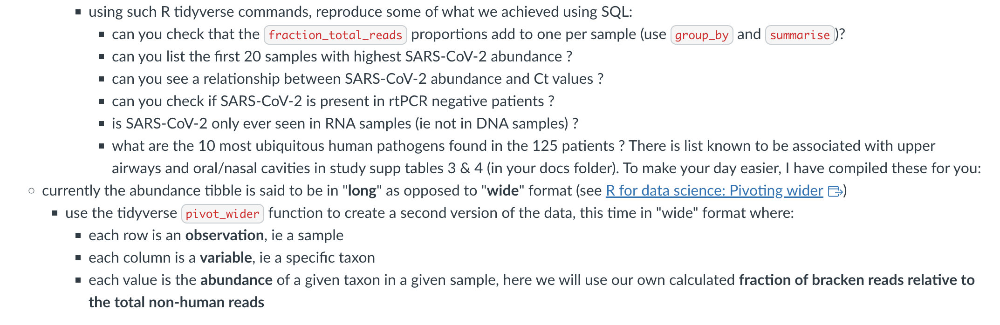

In [15]:
abun_long %>% select(run_accession,fraction_total_reads) %>% group_by(run_accession) %>% summarise(sum(fraction_total_reads))

run_accession,sum(fraction_total_reads)
<chr>,<dbl>
ERR6913101,0.99698
ERR6913102,0.99527
ERR6913103,0.99008
ERR6913104,0.99840
ERR6913106,0.99967
ERR6913107,0.99770
ERR6913108,0.99640
ERR6913109,0.99193
ERR6913111,0.98855


SARS_CoV-2  
**taxon_name** = Severe acute respiratory syndrome-related coronavirus  
**taxonomy_id** = 694009

In [30]:
sars_abun <- abun_long %>% select(run_accession, taxon_name, taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status) %>% 
  filter(taxonomy_id==694009) %>% 
  arrange(desc(fraction_nonhuman_reads))

slice_head(sars_abun,n=20)

run_accession,taxon_name,taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status
<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>
ERR6913216,Severe acute respiratory syndrome-related coronavirus,694009,0.77822,17.99,0.1971328883,SARS-CoV-2 positive
ERR6913221,Severe acute respiratory syndrome-related coronavirus,694009,0.73823,17.88,0.1849809079,SARS-CoV-2 positive
ERR6913214,Severe acute respiratory syndrome-related coronavirus,694009,0.38784,17.81,0.0576540004,SARS-CoV-2 positive
ERR6913210,Severe acute respiratory syndrome-related coronavirus,694009,0.41324,19.52,0.0569822244,SARS-CoV-2 positive
ERR6913204,Severe acute respiratory syndrome-related coronavirus,694009,0.17501,18.42,0.0518487395,SARS-CoV-2 positive
ERR6913203,Severe acute respiratory syndrome-related coronavirus,694009,0.21930,19.38,0.0412597045,SARS-CoV-2 positive
ERR6913217,Severe acute respiratory syndrome-related coronavirus,694009,0.19576,17.56,0.0292371171,SARS-CoV-2 positive
ERR6913215,Severe acute respiratory syndrome-related coronavirus,694009,0.22142,18.89,0.0278418723,SARS-CoV-2 positive
ERR6913219,Severe acute respiratory syndrome-related coronavirus,694009,0.04292,17.93,0.0189486553,SARS-CoV-2 positive


In [33]:
abun_long %>% select(run_accession, taxon_name, taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status) %>% 
  filter(grepl("corona",taxon_name,fixed = TRUE)) %>% 
  arrange(desc(fraction_nonhuman_reads))

run_accession,taxon_name,taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status
<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>
ERR6913216,Severe acute respiratory syndrome-related coronavirus,694009,0.77822,17.99,0.1971328883,SARS-CoV-2 positive
ERR6913221,Severe acute respiratory syndrome-related coronavirus,694009,0.73823,17.88,0.1849809079,SARS-CoV-2 positive
ERR6913214,Severe acute respiratory syndrome-related coronavirus,694009,0.38784,17.81,0.0576540004,SARS-CoV-2 positive
ERR6913210,Severe acute respiratory syndrome-related coronavirus,694009,0.41324,19.52,0.0569822244,SARS-CoV-2 positive
ERR6913204,Severe acute respiratory syndrome-related coronavirus,694009,0.17501,18.42,0.0518487395,SARS-CoV-2 positive
ERR6913203,Severe acute respiratory syndrome-related coronavirus,694009,0.21930,19.38,0.0412597045,SARS-CoV-2 positive
ERR6913217,Severe acute respiratory syndrome-related coronavirus,694009,0.19576,17.56,0.0292371171,SARS-CoV-2 positive
ERR6913215,Severe acute respiratory syndrome-related coronavirus,694009,0.22142,18.89,0.0278418723,SARS-CoV-2 positive
ERR6913219,Severe acute respiratory syndrome-related coronavirus,694009,0.04292,17.93,0.0189486553,SARS-CoV-2 positive


In [24]:
library("ggplot2")
library("ggpubr")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 3 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 3 rows containing non-finite values (stat_cor).”
Warning message:
“Removed 3 rows containing missing values (geom_point).”


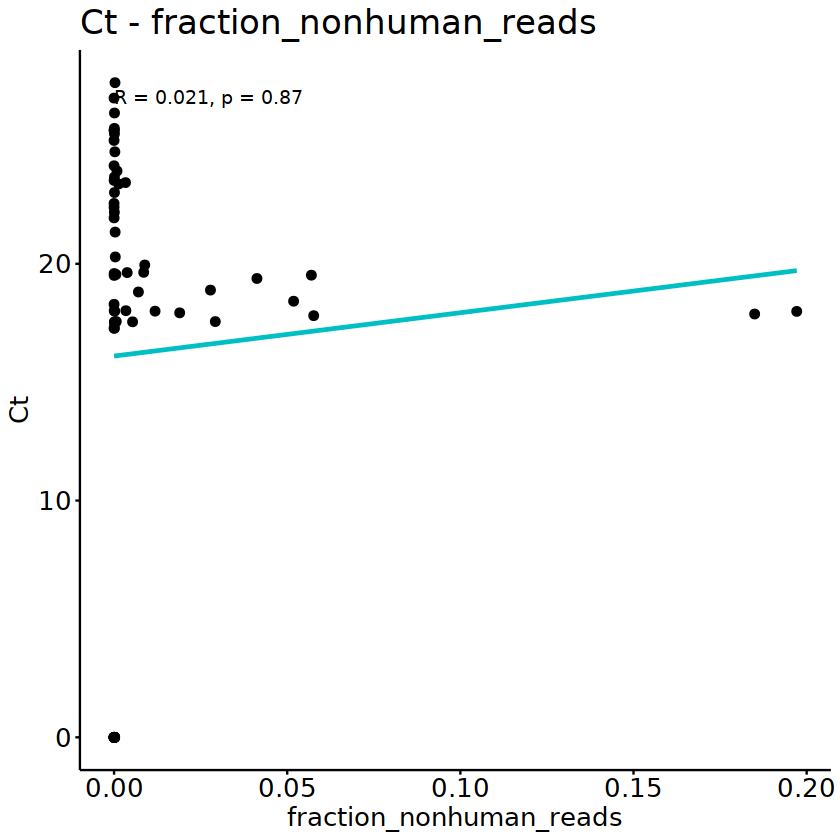

In [26]:
ggscatter(sars_abun, x = "fraction_nonhuman_reads", y = "Ct",
           add="reg.line", add.params = list(color = "#00bfc4"),
           conf.int = FALSE,
           cor.coef = TRUE,
           cor.coeff.args = list(method = "spearman"),
           #cor.method = "spearman",
           ggtheme = theme_classic(),
           #add = "reg.line", add.params = c(color = '#00bfc4'),
           title = "Ct - fraction_nonhuman_reads", xlab = "fraction_nonhuman_reads", ylab = "Ct",
           font.tickslab = c(size=15, color = "black"), font.main = 20,font.y = 15, font.x = 15)

In [29]:
colnames(abun_long)

[1] "run_accession"                 "taxon_name"                    "taxonomy_id"                   "taxonomy_lvl"                  "kraken_assigned_reads"         "added_reads"                   "new_est_reads"                 "fraction_total_reads"         
 [9] "host_subject_id"               "patient_code"                  "nuc"                           "host_body_site"                "host_disease_status"           "miscellaneous_parameter"       "Ct"                            "total_reads"                  
[17] "read_count"                    "base_count"                    "fraction_nonhuman_reads"       "fraction_human_nonhuman_reads"

**Check if there are any SARS-CoV-2 negative patient express SARS-CoV-2**

In [40]:
abun_long %>% select(run_accession, taxon_name, taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status) %>% 
  filter(taxonomy_id==694009 & host_disease_status =="SARS-CoV-2 negative")
  #arrange(desc(fraction_nonhuman_reads))

run_accession,taxon_name,taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status
<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>
ERR6913276,Severe acute respiratory syndrome-related coronavirus,694009,0.00003,21.94,8.181380e-06,SARS-CoV-2 negative
ERR6913275,Severe acute respiratory syndrome-related coronavirus,694009,0.00063,27.65,2.771536e-04,SARS-CoV-2 negative
ERR6913271,Severe acute respiratory syndrome-related coronavirus,694009,0.00001,NA,4.583351e-06,SARS-CoV-2 negative
ERR6913305,Severe acute respiratory syndrome-related coronavirus,694009,0.00046,0.00,1.590100e-04,SARS-CoV-2 negative
ERR6913334,Severe acute respiratory syndrome-related coronavirus,694009,0.00013,0.00,5.814844e-05,SARS-CoV-2 negative
ERR6913306,Severe acute respiratory syndrome-related coronavirus,694009,0.00002,0.00,8.055400e-06,SARS-CoV-2 negative
ERR6913307,Severe acute respiratory syndrome-related coronavirus,694009,0.00001,0.00,3.998637e-06,SARS-CoV-2 negative
ERR6913345,Severe acute respiratory syndrome-related coronavirus,694009,0.00002,0.00,9.453191e-06,SARS-CoV-2 negative
ERR6913312,Severe acute respiratory syndrome-related coronavirus,694009,0.00020,0.00,3.895590e-05,SARS-CoV-2 negative


**Check is SARS-CoV-2 only ever seen in RNA samples (ie not in DNA samples)?**

In [39]:
abun_long %>% select(run_accession, taxon_name, taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status,nuc) %>% 
  filter(taxonomy_id==694009 & nuc=="RNA")

run_accession,taxon_name,taxonomy_id,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status,nuc
<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ERR6913209,Severe acute respiratory syndrome-related coronavirus,694009,0.00753,23.92,8.567145e-04,SARS-CoV-2 positive,RNA
ERR6913208,Severe acute respiratory syndrome-related coronavirus,694009,0.02116,19.95,8.862359e-03,SARS-CoV-2 positive,RNA
ERR6913218,Severe acute respiratory syndrome-related coronavirus,694009,0.01710,17.55,5.349498e-03,SARS-CoV-2 positive,RNA
ERR6913276,Severe acute respiratory syndrome-related coronavirus,694009,0.00003,21.94,8.181380e-06,SARS-CoV-2 negative,RNA
ERR6913197,Severe acute respiratory syndrome-related coronavirus,694009,0.04034,18.00,1.184572e-02,SARS-CoV-2 positive,RNA
ERR6913275,Severe acute respiratory syndrome-related coronavirus,694009,0.00063,27.65,2.771536e-04,SARS-CoV-2 negative,RNA
ERR6913222,Severe acute respiratory syndrome-related coronavirus,694009,0.00002,17.28,7.086245e-06,SARS-CoV-2 positive,RNA
ERR6913324,Severe acute respiratory syndrome-related coronavirus,694009,0.00019,25.64,2.455337e-05,SARS-CoV-2 positive,RNA
ERR6913327,Severe acute respiratory syndrome-related coronavirus,694009,0.00320,23.37,1.325301e-03,SARS-CoV-2 positive,RNA


**10 most ubiquitous human pathogens found in the 125 patients**

In [59]:
abun_long %>% select(run_accession, taxon_name, taxonomy_id,fraction_nonhuman_reads) %>%
  group_by(taxon_name) %>%
  summarise(MAX = max(fraction_nonhuman_reads)) %>%
  arrange(desc(MAX)) %>% slice_head(n=10)
  

taxon_name,MAX
<chr>,<dbl>
Influenza A virus,0.4567765
Haemophilus influenzae,0.4338889
Klebsiella pneumoniae,0.3522060
Cutibacterium acnes,0.3281830
Staphylococcus aureus,0.2794385
Corynebacterium propinquum,0.2489466
Dolosigranulum pigrum,0.2262973
Streptococcus salivarius,0.2048470
Severe acute respiratory syndrome-related coronavirus,0.1971329


### "wild" version

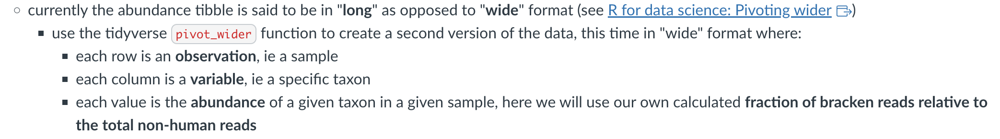

In [62]:
abun_wild <-
   abun_long %>% select(run_accession, taxon_name, fraction_nonhuman_reads) %>%
   pivot_wider(names_from = taxon_name, values_from = fraction_nonhuman_reads, values_fill = 0)

slice_head(abun_wild, n=5)

run_accession,Streptococcus oralis,Streptococcus sp. LPB0220,Streptococcus sp. HSISM1,Streptococcus sp. oral taxon 064,Streptococcus sp. oral taxon 061,Streptococcus salivarius,Streptococcus mitis,Streptococcus intermedius,Streptococcus vestibularis,⋯,Staphylococcus sp. MZ9,Staphylococcus sp. MZ8,Chryseobacterium nepalense,Peeveelvirus CN125,Biseptimavirus bv23MRA,Biseptimavirus IME136101,Phietavirus pv3MRA,Staphylococcus sp. IVB6240,Sutcliffiella cohnii,Aeromonas sp. Ne-1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ERR6913112,0.007155917,0.001229431,0.0009457159,5.516676e-04,0.0001891432,0.003641006,0.002506147,2.175147e-03,0.0012451926,⋯,0,0,0,0,0,0,0,0,0,0
ERR6913113,0.000000000,0.000000000,0.0000000000,0.000000e+00,0.0000000000,0.000000000,0.000000000,0.000000e+00,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
ERR6913320,0.003536297,0.007010695,0.0067006618,9.391706e-05,0.0019599849,0.003821250,0.007972277,1.787626e-04,0.0002022418,⋯,0,0,0,0,0,0,0,0,0,0
ERR6913209,0.000000000,0.000000000,0.0000000000,0.000000e+00,0.0000000000,0.000000000,0.000000000,0.000000e+00,0.0000000000,⋯,0,0,0,0,0,0,0,0,0,0
ERR6913122,0.001556366,0.002671314,0.0027679163,5.232610e-05,0.0015080649,0.015328863,0.002059501,7.513491e-05,0.0001194108,⋯,0,0,0,0,0,0,0,0,0,0


In [63]:
abun_wild_taxon <-
   abun_long %>% select(run_accession, taxon_name, fraction_nonhuman_reads) %>%
   pivot_wider(names_from = run_accession, values_from = fraction_nonhuman_reads, values_fill = 0)

slice_head(abun_wild_taxon, n=5)

taxon_name,ERR6913112,ERR6913113,ERR6913320,ERR6913209,ERR6913122,ERR6913208,ERR6913218,ERR6913349,ERR6913179,⋯,ERR6913290,ERR6913292,ERR6913300,ERR6913329,ERR6913301,ERR6913330,ERR6913303,ERR6913332,ERR6913127,ERR6913223
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Streptococcus oralis,0.0071559170,0,3.536297e-03,0,0.0015563659,0,0.002035742,4.490799e-04,2.545224e-03,⋯,0.0019736935,0.0013114696,3.211530e-03,0.0006910871,2.970500e-03,1.011372e-03,3.771005e-03,0.0033699533,0,0.0001158537
Streptococcus sp. LPB0220,0.0012294307,0,7.010695e-03,0,0.0026713143,0,0.004570818,6.347872e-04,3.729943e-03,⋯,0.0009987694,0.0017903188,6.110143e-03,0.0033781329,7.908116e-04,5.050799e-04,5.432415e-03,0.0045345134,0,0.0000000000
Streptococcus sp. HSISM1,0.0009457159,0,6.700662e-03,0,0.0027679163,0,0.004249569,3.579486e-04,3.554157e-03,⋯,0.0008807153,0.0013018482,5.755463e-03,0.0026507134,7.324369e-04,3.553143e-04,4.838888e-03,0.0033096967,0,0.0000000000
Streptococcus sp. oral taxon 064,0.0005516676,0,9.391706e-05,0,0.0000523261,0,0.000000000,1.785045e-05,5.200102e-05,⋯,0.0001203996,0.0001572727,8.293513e-05,0.0000000000,8.150426e-05,6.972892e-05,6.776499e-05,0.0001084620,0,0.0000000000
Streptococcus sp. oral taxon 061,0.0001891432,0,1.959985e-03,0,0.0015080649,0,0.002084628,1.525118e-04,3.541722e-03,⋯,0.0010972782,0.0003500706,4.134993e-04,0.0001468753,7.390454e-04,2.067614e-04,1.416989e-03,0.0005925237,0,0.0000000000


## Heatmap visualisation of the abundance matrix

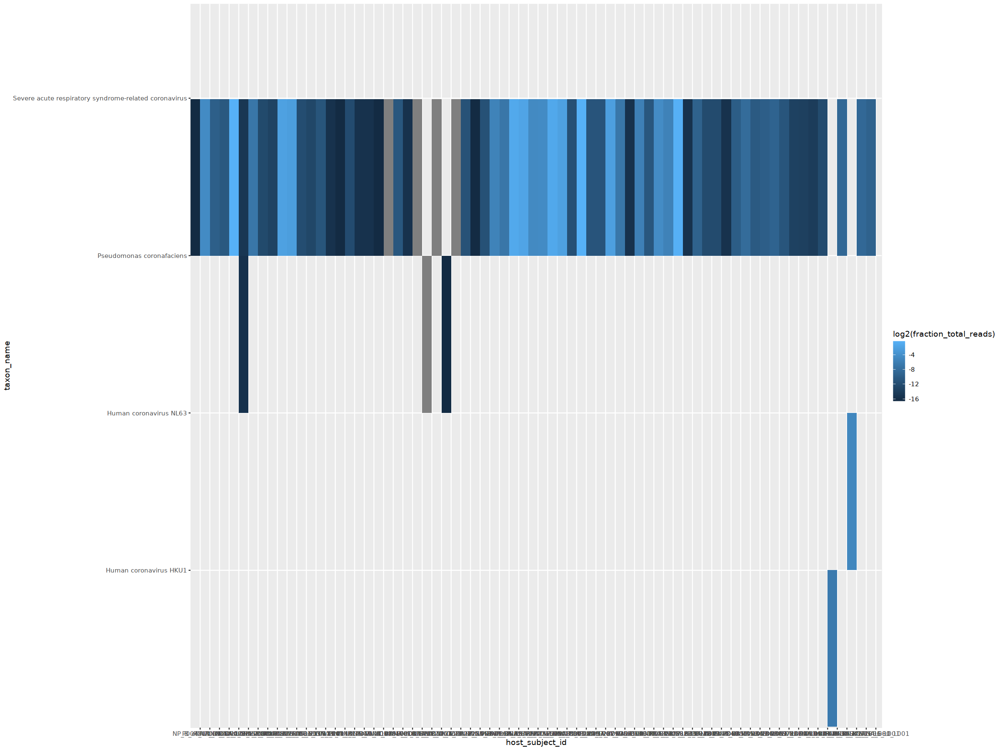

In [69]:
options(repr.plot.width=20, repr.plot.height=15)
abun_long %>%
 filter(str_detect(taxon_name,"corona")) %>%
 arrange(nuc, fraction_total_reads)  %>%
 select(run_accession, taxon_name, new_est_reads,fraction_total_reads,Ct,fraction_nonhuman_reads,host_disease_status,miscellaneous_parameter,nuc,host_subject_id) %>%
ggplot(aes(host_subject_id, taxon_name, fill=log2(fraction_total_reads))) +
 geom_raster(hjust = 0, vjust = 0)

In [70]:
library("heatmaply")
library(RColorBrewer)

Loading required package: plotly


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


Loading required package: viridis

Loading required package: viridisLite


Welcome to heatmaply version 1.3.0

Type citation('heatmaply') for how to cite the package.
Type ?heatmaply for the main documentation.

The github page is: https://github.com/talgalili/heatmaply/
Please submit your suggestions and bug-reports at: https://github.com/talgalili/heatmaply/issues
You may ask questions at stackoverflow, use the r and heatmaply tags: 
	 https://stackoverflow.com/questions/tagged/heatmaply




In [99]:
abun_wild_taxon %>%
 column_to_rownames(var="taxon_name") %>%
 head(100) %>% mutate_if(is.numeric, ~ifelse(abs(.) == 0,0.0001,.)) %>% 
 mutate_if(is_double,log2) 

,ERR6913112,ERR6913113,ERR6913320,ERR6913209,ERR6913122,ERR6913208,ERR6913218,ERR6913349,ERR6913179,ERR6913180,⋯,ERR6913290,ERR6913292,ERR6913300,ERR6913329,ERR6913301,ERR6913330,ERR6913303,ERR6913332,ERR6913127,ERR6913223
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Streptococcus oralis,-7.126648,-13.28771,-8.143545,-13.28771,-9.327603,-13.287712,-8.940229,-11.120740,-8.617992,-7.488157,⋯,-8.984886,-9.574600,-8.282523,-10.498845,-8.395079,-9.949470,-8.050835,-8.213056,-13.287712,-13.075408
Streptococcus sp. LPB0220,-9.667794,-13.28771,-7.156227,-13.28771,-8.548235,-13.287712,-7.773332,-10.621439,-8.066631,-11.495246,⋯,-9.967561,-9.125568,-7.354578,-8.209558,-10.304378,-10.951201,-7.524190,-7.784837,-13.287712,-13.287712
Streptococcus sp. HSISM1,-10.046306,-13.28771,-7.221481,-13.28771,-8.496984,-13.287712,-7.878468,-11.447960,-8.136277,-11.361815,⋯,-10.149037,-9.585223,-7.440852,-8.559404,-10.415008,-11.458617,-7.691109,-8.239085,-13.287712,-13.287712
Streptococcus sp. oral taxon 064,-10.823913,-13.28771,-13.378253,-13.28771,-14.222110,-13.287712,-13.287712,-15.773680,-14.231100,-13.264887,⋯,-13.019882,-12.634444,-13.557657,-13.287712,-13.582765,-13.807883,-13.849100,-13.170523,-13.287712,-13.287712
Streptococcus sp. oral taxon 061,-12.368234,-13.28771,-8.994942,-13.28771,-9.373086,-13.287712,-8.905994,-12.678792,-8.141333,-7.095315,⋯,-9.831855,-11.480066,-11.239828,-12.733120,-10.402049,-12.239745,-9.462955,-10.720840,-13.287712,-13.287712
Streptococcus salivarius,-8.101447,-13.28771,-8.031740,-13.28771,-6.027606,-13.287712,-5.216751,-9.990480,-4.794457,-6.271805,⋯,-5.765467,-8.787154,-6.677531,-9.332870,-6.390139,-5.956515,-6.171271,-7.843794,-13.287712,-13.107588
Streptococcus mitis,-8.640313,-13.28771,-6.970792,-13.28771,-8.923489,-13.287712,-8.574912,-11.011312,-7.707027,-6.030782,⋯,-7.413416,-7.888510,-8.354856,-10.623496,-5.996077,-8.058582,-9.147896,-10.003570,-9.926631,-14.462431
Streptococcus intermedius,-8.844672,-13.28771,-12.449668,-13.28771,-13.700157,-13.287712,-13.604019,-15.416745,-11.760309,-13.108442,⋯,-14.116743,-9.965951,-14.010708,-15.495621,-12.057509,-13.833194,-13.910068,-14.465979,-13.287712,-13.287712
Streptococcus vestibularis,-9.649415,-13.28771,-12.271631,-13.28771,-13.031779,-13.287712,-11.718190,-16.321167,-12.223281,-11.758280,⋯,-13.642812,-15.257238,-12.883427,-15.444995,-14.237630,-15.038664,-13.122119,-14.708180,-13.287712,-13.287712


Warning message:
“Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()”


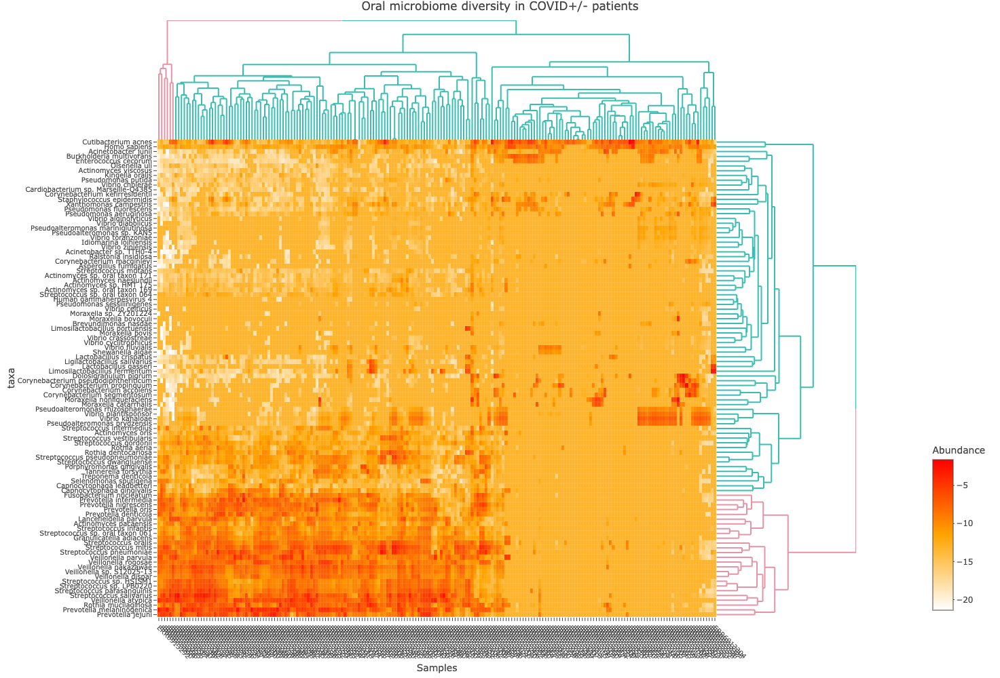

In [101]:
options(repr.plot.width=20, repr.plot.height=15)

abun_wild_taxon %>%
 column_to_rownames(var="taxon_name") %>%
 head(100) %>% mutate_if(is.numeric, ~ifelse(abs(.) == 0,0.0001,.)) %>%
 mutate_if(is_double,log2)%>%
heatmaply(
    k_col = 2, k_row = 2, xlab="Samples", ylab="taxa",grid_gap=.1,
    colors=colorRampPalette(c('white','orange','red'))(50),
    main="Oral microbiome diversity in COVID+/- patients",
    key.title='Abundance',
    plot_method='plotly') %>%
layout(height=1000, width=1000)